In [9]:
import os
import json
from pathlib import Path
from PIL import Image

def convert_labelme_to_yolo(labelme_json_dir, yolo_txt_dir, img_dir):
    # Ensure output directory exists
    Path(yolo_txt_dir).mkdir(parents=True, exist_ok=True)

    # Loop over all JSON files in the directory
    for json_file in Path(labelme_json_dir).glob('*.json'):
        with open(json_file, 'r') as f:
            data = json.load(f)

        # Get image size
        img_file = os.path.join(img_dir, data["imagePath"])  # Use the 'imagePath' key to find the image file
        if not os.path.exists(img_file):
            print(f"Image file {img_file} not found. Skipping annotation.")
            continue

        img = Image.open(img_file)
        img_width, img_height = img.size

        # Open the corresponding YOLO file to write annotations
        yolo_file = os.path.join(yolo_txt_dir, json_file.stem + '.txt')

        # Check if there are any shapes in the annotation
        if not data.get('shapes'):
            print(f"No shapes found in {json_file}. Skipping.")
            continue

        with open(yolo_file, 'w') as yolo_f:
            for shape in data['shapes']:
                points = shape['points']
                print(f"Processing shape with points: {points}")  # Debugging line

                # For simplicity, we are skipping polygons with more than 4 points
                if len(points) < 3:
                    continue  # Skip shapes that are not polygons

                # Calculate the bounding box for the polygon (min/max of the points)
                xmin = min(p[0] for p in points)
                ymin = min(p[1] for p in points)
                xmax = max(p[0] for p in points)
                ymax = max(p[1] for p in points)

                # Calculate YOLO format values
                x_center = (xmin + xmax) / 2 / img_width
                y_center = (ymin + ymax) / 2 / img_height
                width = (xmax - xmin) / img_width
                height = (ymax - ymin) / img_height

                # Assuming the class ID is 0 since you have only one class
                yolo_f.write(f"0 {x_center} {y_center} {width} {height}\n")

    print("Conversion to YOLO format is complete.")

# Example usage
labelme_json_dir = 'labelme'  # Directory containing LabelMe JSON files
yolo_txt_dir = 'yolodata'  # Directory to save YOLO annotations
img_dir = 'labelme'  # Directory containing the images

convert_labelme_to_yolo(labelme_json_dir, yolo_txt_dir, img_dir)


Processing shape with points: [[1, 151], [22, 273], [481, 278], [500, 207], [500, 0], [0, 0]]
Processing shape with points: [[25, 280], [56, 515], [415, 495], [478, 274]]
Processing shape with points: [[45, 522], [62, 666], [354, 666], [406, 498], [55, 513], [52, 493]]
Processing shape with points: [[0, 302], [31, 307], [52, 487], [43, 514], [53, 621], [0, 630]]
Processing shape with points: [[1, 633], [45, 626], [47, 666], [0, 666]]
Processing shape with points: [[436, 513], [409, 612], [440, 666], [500, 666], [500, 634]]
Processing shape with points: [[476, 386], [440, 505], [500, 633], [500, 409]]
Processing shape with points: [[498, 292], [477, 383], [500, 406]]
Processing shape with points: [[388, 566], [368, 637], [378, 666], [394, 663], [410, 612]]
Processing shape with points: [[423, 475], [391, 565], [409, 612], [439, 505]]
Processing shape with points: [[458, 350], [422, 474], [439, 505], [475, 373]]
Processing shape with points: [[376.5581395348837, 167.05426356589146], [375

In [12]:
import os
import random
import shutil
from pathlib import Path

def split_dataset(image_dir, label_dir, train_ratio=0.8, seed=42):
    # Create directories for images and labels
    data_dirs = ['images/train', 'images/val', 'labels/train', 'labels/val']
    for data_dir in data_dirs:
        Path(data_dir).mkdir(parents=True, exist_ok=True)
    
    # Get list of images and labels
    image_files = [f for f in os.listdir(image_dir) if f.endswith(('.jpg', '.png', '.jpeg'))]
    label_files = [f for f in os.listdir(label_dir) if f.endswith('.txt')]
    
    # Ensure that each image has a corresponding label
    image_basenames = {os.path.splitext(f)[0] for f in image_files}
    label_basenames = {os.path.splitext(f)[0] for f in label_files}
    
    if image_basenames != label_basenames:
        print("Warning: Some images don't have corresponding labels.")
    
    # Shuffle the files for splitting
    random.seed(seed)
    all_files = list(image_basenames)
    random.shuffle(all_files)

    # Split files into train and validation sets
    train_size = int(len(all_files) * train_ratio)
    train_files = all_files[:train_size]
    val_files = all_files[train_size:]

    # Move the files into their respective folders
    for file in train_files:
        shutil.move(os.path.join(image_dir, file + '.jpg'), os.path.join('images/train', file + '.jpg'))
        shutil.move(os.path.join(label_dir, file + '.txt'), os.path.join('labels/train', file + '.txt'))
    
    for file in val_files:
        shutil.move(os.path.join(image_dir, file + '.jpg'), os.path.join('images/val', file + '.jpg'))
        shutil.move(os.path.join(label_dir, file + '.txt'), os.path.join('labels/val', file + '.txt'))

    print(f"Training set: {len(train_files)} images")
    print(f"Validation set: {len(val_files)} images")

def create_data_yaml(dataset_path, class_names):
    # Create the data.yaml file for YOLOv5
    data_yaml = f"""
    train: {dataset_path}/images/train
    val: {dataset_path}/images/val

    nc: {len(class_names)}
    names: {class_names}
    """

    # Save the data.yaml file
    with open(f"{dataset_path}/data.yaml", "w") as f:
        f.write(data_yaml)
    
    print("data.yaml file created")

# Example usage
image_dir = 'dataset_yolo/images'
label_dir = 'dataset_yolo/labels'
dataset_path = 'dataset_yolo/'

# Split the dataset and create necessary directories
split_dataset(image_dir, label_dir)

# Create data.yaml with class names (you can update this with your actual class names)
create_data_yaml(dataset_path, ['Carton'])  # Example class name

Training set: 6720 images
Validation set: 1681 images
data.yaml file created


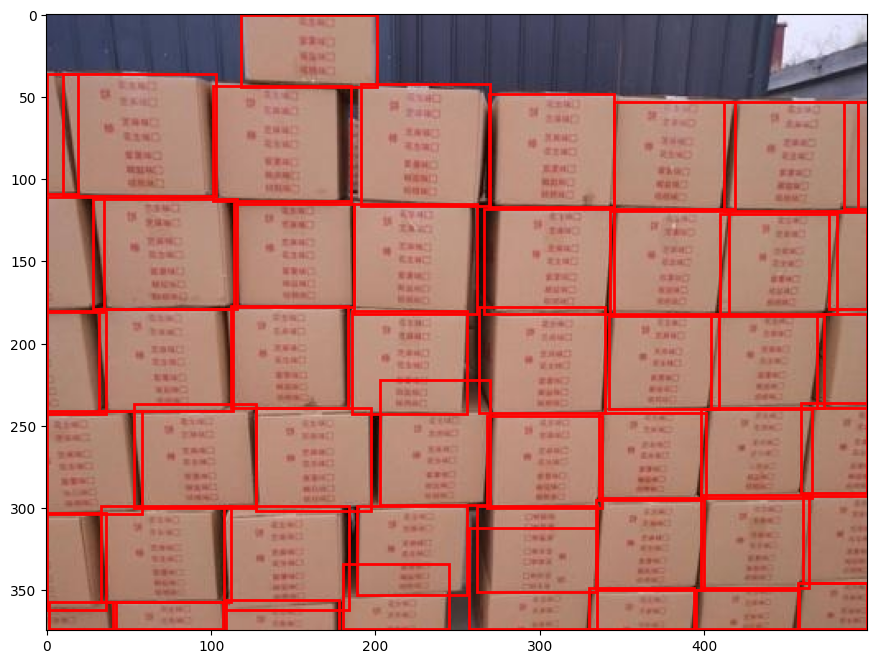

In [13]:
import os
import json
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from PIL import Image

def visualize_first_image(image_folder, label_folder):
    # Get the first image from the image folder (assuming images are .png, adjust if needed)
    image_files = [f for f in os.listdir(image_folder) if f.endswith('.jpg')]
    if not image_files:
        print("No images found in the folder.")
        return

    # Take the first image
    image_path = os.path.join(image_folder, image_files[0])

    # Get the corresponding label file (assuming same name but with .txt extension)
    label_path = os.path.join(label_folder, image_files[0].replace('.jpg', '.txt'))
    if not os.path.exists(label_path):
        print(f"No label file found for {image_files[0]}")
        return

    # Open the image
    img = Image.open(image_path)
    img_width, img_height = img.size

    # Create a plot
    fig, ax = plt.subplots(1, figsize=(12, 8))
    ax.imshow(img)

    # Read the corresponding YOLO annotation file
    with open(label_path, 'r') as f:
        lines = f.readlines()

    # Loop over the bounding boxes in YOLO format
    for line in lines:
        class_id, x_center, y_center, width, height = map(float, line.strip().split())
        
        # Convert from YOLO normalized coordinates to pixel coordinates
        xmin = (x_center - width / 2) * img_width
        ymin = (y_center - height / 2) * img_height
        xmax = (x_center + width / 2) * img_width
        ymax = (y_center + height / 2) * img_height

        # Create a rectangle to represent the bounding box
        rect = patches.Rectangle((xmin, ymin), xmax - xmin, ymax - ymin, linewidth=2, edgecolor='r', facecolor='none')
        ax.add_patch(rect)

    plt.show()

# Example usage:
image_folder = 'final/images/train'  # Folder containing images
label_folder = 'final/labels/train'  # Folder containing YOLO label files

visualize_first_image(image_folder, label_folder)